# **¿Que propiedades del vino se relacionan con alta calidad?**

El dataset se saco de [de aqui](https://archive.ics.uci.edu/dataset/186/wine+quality).

Los datasets provienen de muestras de vino portugues "Vinho Verde". Para mas informacion consultar [la pagina web de Vinho Verde](http://www.vinhoverde.pt/), o el  [articulo de 2009 que ya lo ha estudiado](https://www.researchgate.net/publication/221612614_Using_Data_Mining_for_Wine_Quality_Assessment).


Cada dataset contiene siguientes fisico-quimicos faciles de analizar:

* ***Acidez fija***: Es la cantidad de ácidos del vino que no se evaporan. Estos pueden provenir tanto de la uva (como el ácido tartárico, málico o cítrico) como del proceso de fermentación (como el ácido succínico). La unidad en el dataset es g(ácido tartárico)/L.
* ***Acidez volatil***: Se refiere a la cantidad de ácidos que se pueden destilar del vino, principalmente ácido acético, aunque no es el único. A concentraciones de 1 g/L su olor se asemeja al vinagre. En el dataset se mide en g(ácido acético)/L. Existen procedimientos con dióxido de azufre para controlar esta variable
* ***Acido citrico***: Es un acidulante, también usado en la industria alimentaria. Se mide en g/L.
* ***Azucar residual***: Cantidad de azúcares que permanecen en el vino después de la fermentación. Se mide en g/L.
* ***Cloruros***: Cantidades de cloruro que provienen tanto de la uva como de otras sales añadidas para mejorar propiedades (por ejemplo el cloruro de plata ). Se mide en g(NaCl)/L. 
* ***Dioxido de Azufre total***:  Relacionado con los sulfitos, se emplea como conservante para evitar la oxidación de algunos compuestos. Su presencia debe ser advertida si supera los 10 mg/L. A partir de ahora se denominará SO2 total.
* ***Dioxido de Azufre libre***: Es la fracción del dióxido de azufre que no ha reaccionado con otros compuestos, por lo que permanece disponible para proteger al vino. Se mide en mg/L y en adelante se nombrará como SO₂ libre. https://extension.okstate.edu/fact-sheets/understanding-free-sulfur-dioxide-fso2-in-wine.html
* ***Densidad***: Masa por unidad de volumen, medida en g/L.
* ***pH***: medida de acidez. Cuanto mas bajo, mas acido es el vino.
* ***Sulfatos***: Procedentes tanto de la planta como de la adición de sulfato de plata, que se utiliza para eliminar microorganismos no deseados. Se mide en g(K₂SO₄)/L.
* ***Alcohol***:  Porcentaje de volumen de etanol presente en el vino (% vol).


Y un valor de 1-10 de una cata a ciegas de la muestra.


https://waterhouse.ucdavis.edu/whats-in-wine/fixed-acidity

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

Primero leemos el CSV del vino tinto

In [2]:
data_raw=pd.read_csv("wine+quality/winequality-red.csv", sep=";")
data_raw

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [3]:
data_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


No parece que haya haga falta procesar los datos de momento.

Veamos como se distribuyen los valores:

<Axes: xlabel='residual sugar', ylabel='Count'>

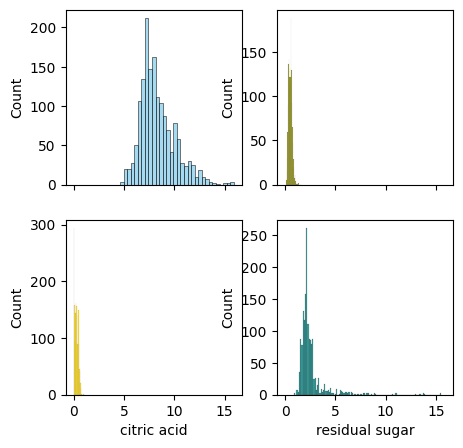

In [4]:
f, axes = plt.subplots(2, 2, figsize=(5,5), sharex=True)
sns.histplot(data_raw["fixed acidity"] , color="skyblue", ax=axes[0, 0])
sns.histplot(data_raw["volatile acidity"] , color="olive", ax=axes[0, 1])
sns.histplot(data_raw["citric acid"] , color="gold", ax=axes[1, 0])
sns.histplot(data_raw["residual sugar"] , color="teal", ax=axes[1, 1])

<Axes: xlabel='density', ylabel='Count'>

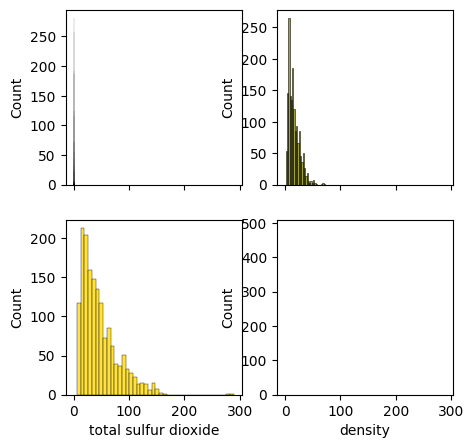

In [5]:
f, axes = plt.subplots(2, 2, figsize=(5,5), sharex=True)
sns.histplot(data_raw["chlorides"] , color="skyblue", ax=axes[0, 0], bins=100)
sns.histplot(data_raw["free sulfur dioxide"] , color="olive", ax=axes[0, 1])
sns.histplot(data_raw["total sulfur dioxide"] , color="gold", ax=axes[1, 0])
sns.histplot(data_raw["density"] , color="teal", ax=axes[1, 1], bins= 10)

La densidad existe, lo que pasa es que esta en torno a 1.

<Axes: xlabel='quality', ylabel='Count'>

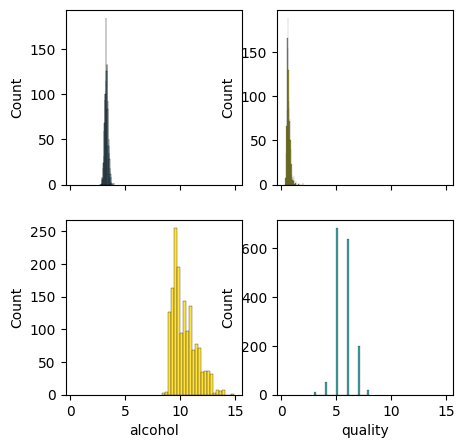

In [6]:
f, axes = plt.subplots(2, 2, figsize=(5,5), sharex=True)
sns.histplot(data_raw["pH"] , color="skyblue", ax=axes[0, 0])
sns.histplot(data_raw["sulphates"] , color="olive", ax=axes[0, 1])
sns.histplot(data_raw["alcohol"] , color="gold", ax=axes[1, 0])
sns.histplot(data_raw["quality"] , color="teal", ax=axes[1, 1])


<Axes: xlabel='citric acid', ylabel='Count'>

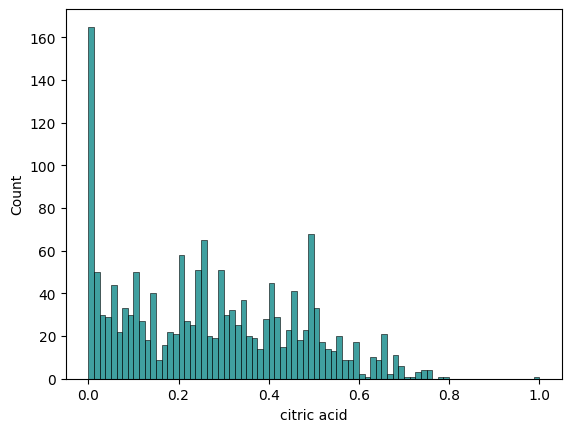

In [7]:
"""["fixed acidity"]
["volatile acidity"]
["citric acid"]
["residual sugar"]
["chlorides"]
["free sulfur dioxide"]
["total sulfur dioxide"]
["density"]
["pH"]
["sulphates"]
["alcohol"]"""
sns.histplot(data_raw["citric acid"] , color="teal", bins=80)

Ahora veamos cuales de estas propiedades se relacionan entre si:

<Axes: >

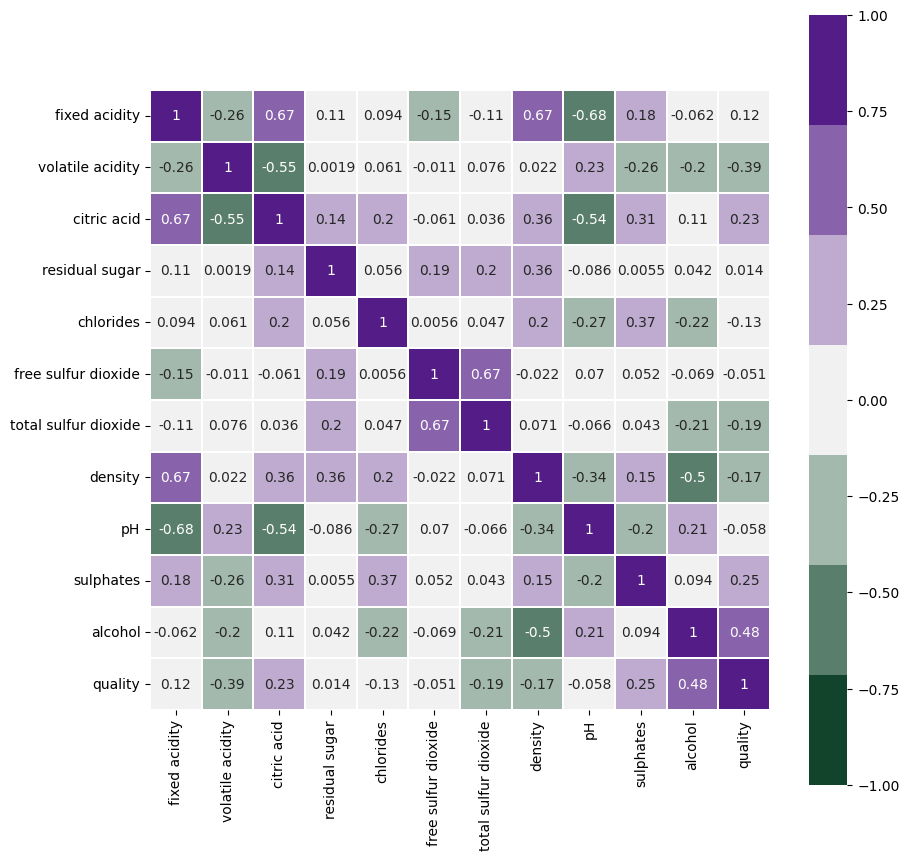

In [8]:
plt.figure(figsize=(10,10))
sns.heatmap(data_raw.corr(),
            vmin=-1,
            vmax=1,
            cmap=sns.diverging_palette(145, 280, s=85, l=25, n=7),
            square=True,
            linewidths=.1,
            annot=True)

Consideraremos 0.15 como punto cut-off.

* La acidez fija esta relacionada:
    * Acidez volatil 
    * Negativamente ácido cítrico
    * Densidad
    * Negativamente con el pH
    * Sulfato
    * SO2 libre
    * SO2 total

Era esperable que estos esten relacionados con las variables que miden acidos y con el sulfato.  

* La acidez volatil esta relacionada:
    * Negativamente Acidez volatil
    * Negativamente Acido citrico
    * Azucar residual
    * Cloruro
    * Densidad
    * Sulfato
    * Calidad


* El azúcar residual:
    * Acido cítrico
    * SO2 y SO2 libre
    * Densidad
Tiene sentido de que el azucar este relacioano con el citrico, ya que este acido podria estar relacionado con la fermentación

* Cloruro:
    * Cítrico
    * Densidad
    * Negativamente pH
    * Sulfatos
    * Negativamente alcohol


* El SO2 libre
    * SO2 total (obviamente)
    * Azucar residual
    * Acidez fija

* SO2 total 
    * SO2 libre
    * Negativamente alcohol 
    * Negativamente la calidad

* Densidad
    * Acidez fija
    * Citrico
    * azucar 
    * cloro
    * Negativamente pH
    * Negativamente Alcphol
    * Sulfatos
    * Negativamente calidad

* pH
    * Negativamente acidez fija 
    * Acidez fija
    * negetivamente citrico
    * Negativamente cloruro
    * Negativamente densidad
    * Negativamente Sulfato
    * Alcohol

* Sulfato
    * Acidez fija
    * Negativamente Acidez volatil
    * Acido citrico
    * Cloruro
    * Densidad
    * Negativamente pH
    * Positivamente calidad


* El alcohol:
    * Negativamente con la densidad
    * Negativamente con los acidos volatiles 
    * Cloruros 
    * SO2 total 
Tiene sentido que que un alto contenido en alcohol este realcionado con una baja densidad
Tambien tiene sentido que los vino que tengan mas acidos volatiles tengan menos alcohol. Podria ser que que los acidos volatiles no se hayan tranformado al completo se formen a  partir del alchol. Aunque lo mas probabe es que los acidos provienen del alcohol.

* Y finalmente la calidad esta relacionada:
    * Negativamente Acidez volatil (-0.39)
    * Acido citrico(0.23)
    * Negativamente con al SO2 total(-0.19)
    * Negativamente con la densidad(-0.17)
    * Sulfatos (0.25)
    * Alcohol(0.48)
 

Parece que los consumidores valoran especialmente el contenido de alcohol y la concentración de ácido cítrico en el vino. Además, una mayor concentración de sulfatos también se asocia con una mejor calidad percibida.

Por el contrario, los ácidos volátiles, el dióxido de azufre (SO₂) y una baja densidad presentan una correlación negativa con la calidad.

Estudiemos mas a fondo esto

<Figure size 1000x600 with 0 Axes>

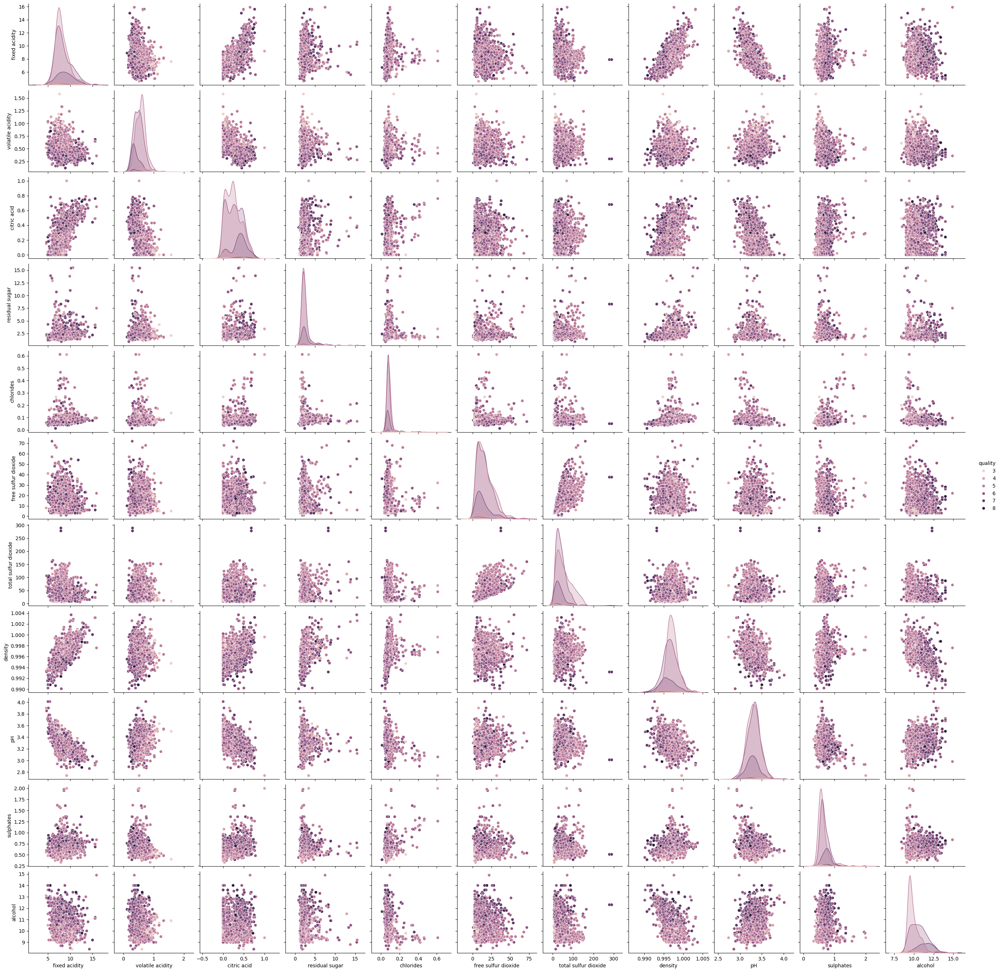

In [9]:
"""["fixed acidity"]
["volatile acidity"]
["citric acid"]
["residual sugar"]
["chlorides"]
["free sulfur dioxide"]
["total sulfur dioxide"]
["density"]
["pH"]
["sulphates"]
["alcohol"]"""
plt.figure(figsize=(10,6))
sns.pairplot(data_raw, hue="quality")

La acidez volatil, acido citrico, y alcohol tienen las distribuciones mas interesantes, vamos a estudiarlas mas de cerca.

#### Primero acidez volatil

<Axes: xlabel='volatile acidity', ylabel='Density'>

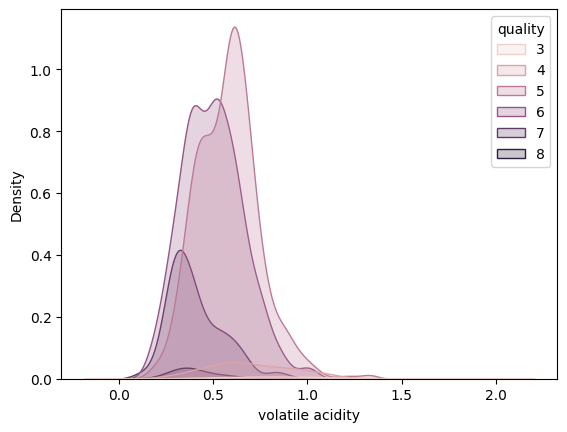

In [10]:

sns.kdeplot(x="volatile acidity", data=data_raw, hue="quality",  fill=True)



'import seaborn as sns\nsns.displot(density, kde=True)'

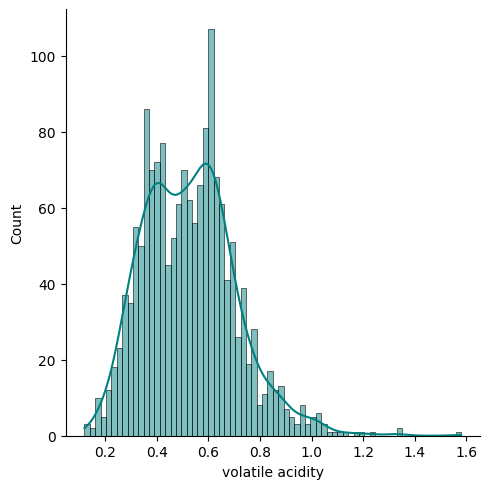

In [11]:
sns.displot(data_raw["volatile acidity"], kde= True, color="teal", bins=70 )

"""import seaborn as sns
sns.displot(density, kde=True)"""

Como se habia comentado antes,una menor concentracion de acido citrico se asocia a una mejor calidad. Aunque en las curvas parecia ser que practicamente en todas las calidades existen tres concentraciones en general. En el histograma se ve mas claro

### Ahora acido citrico

<Axes: xlabel='citric acid', ylabel='Density'>

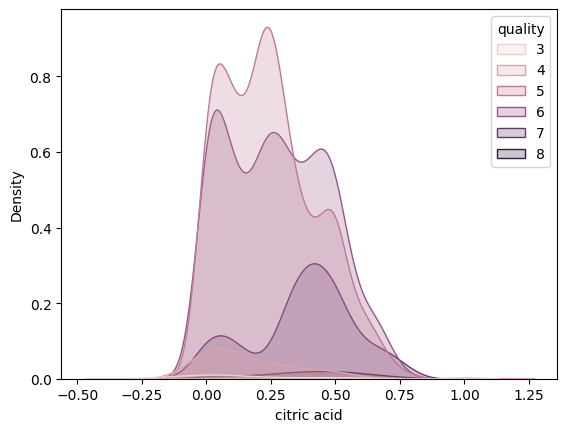

In [12]:

sns.kdeplot(x="citric acid", data=data_raw, hue="quality",  fill=True)

<Axes: xlabel='citric acid', ylabel='Count'>

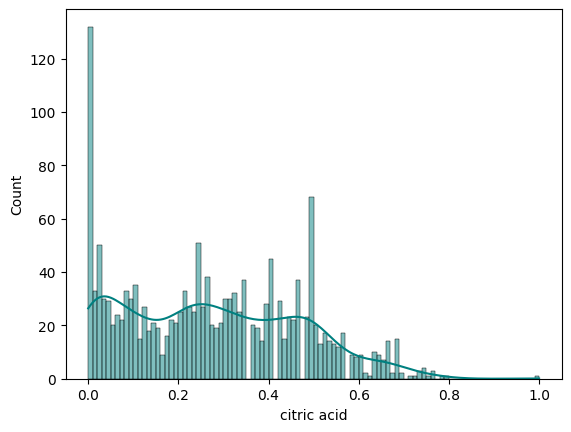

In [13]:
sns.histplot(data_raw["citric acid"] , color="teal", bins=100, kde= True)

Aqui pasa algo parecido. En las curvas se ven 3 niveles, pero en el histograma no se ve tan claro y es mas probable de que la muestra sea demasiado pequeña.
Estos "tres niveles"  seria 0; 0,25; y cerca de 0,50.


### Ahora contenido en alcohol

<Axes: xlabel='alcohol', ylabel='Density'>

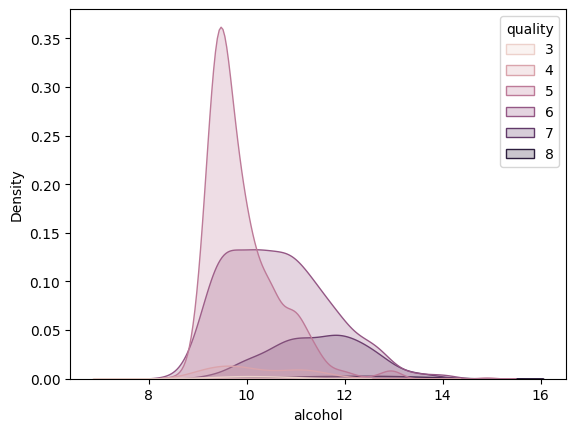

In [14]:
sns.kdeplot(x="alcohol", data=data_raw, hue="quality",  fill=True)

<Axes: xlabel='alcohol', ylabel='Count'>

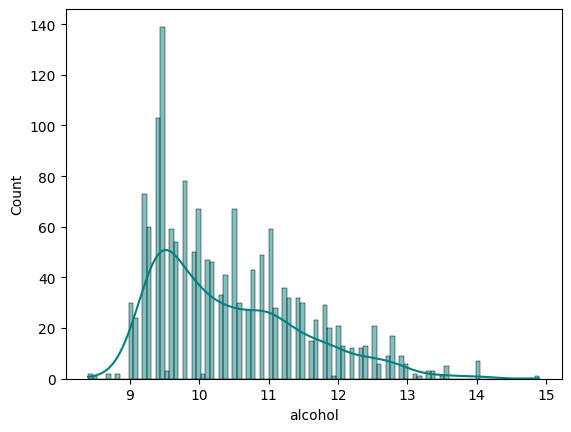

In [15]:
sns.histplot(data_raw["alcohol"] , color="teal", bins=100, kde= True)

Se puede observar que los vinos de menor calidad presentan una concentración de alcohol más baja, aproximadamente en torno al 9,5%. En cambio, los vinos de mayor calidad muestran una distribución mucho más dispersa, aunque tienden a concentrarse mayoritariamente en valores más altos de alcohol.

#### Finalmente sulfatos

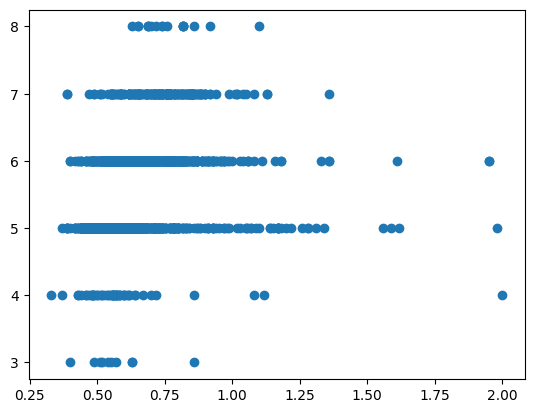

In [16]:
plt.scatter(x=data_raw["sulphates"], y=data_raw["quality"])

Parece que los vinos de calidad inferior presentan una mayor variabilidad en la concentración de sulfatos, lo que podría indicar un menor control durante su elaboración. Por el contrario, los vinos de mayor calidad no solo muestran concentraciones menos dispersas, sino que además tienden a agruparse en torno a los 0,75 g/L.

______

Ahora veamos como se relacionan los tres a la vez.

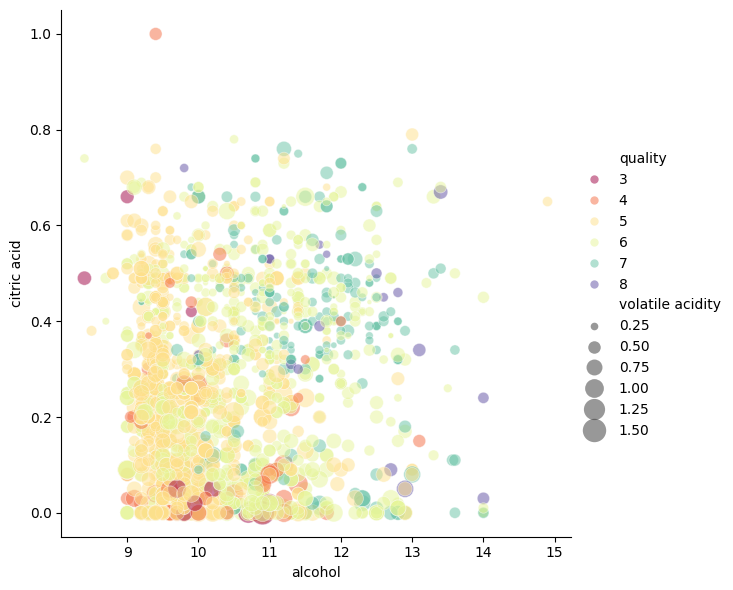

In [17]:
sns.relplot(data=data_raw,
            x="alcohol",
            y="citric acid",
            hue="quality", size="volatile acidity",
            sizes=(4, 300),
            alpha=.5, palette="Spectral",
            height=6)

Hay demasiados vinos de baja calidad eclipsando la grafica.
Filtramos para solo ver los  vinos de maxima calidad:

<Figure size 200x200 with 0 Axes>

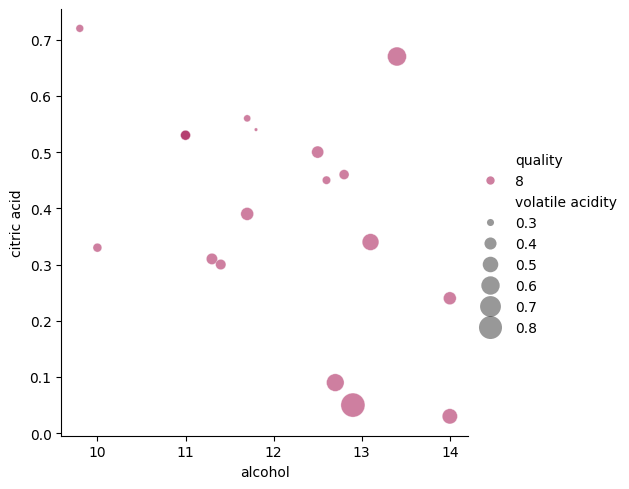

In [18]:
condicion=data_raw["quality"]>7
plt.figure(figsize=(2,2))
sns.relplot(data=data_raw[condicion],
            x="alcohol",
            y="citric acid",
            hue="quality", size="volatile acidity",
            sizes=(6, 300),
            alpha=.5, palette="Spectral",
            height=5)

Aunque que se vean de forma clara son datos demasiado dispersos y escasos como para ver una tendencia clara.

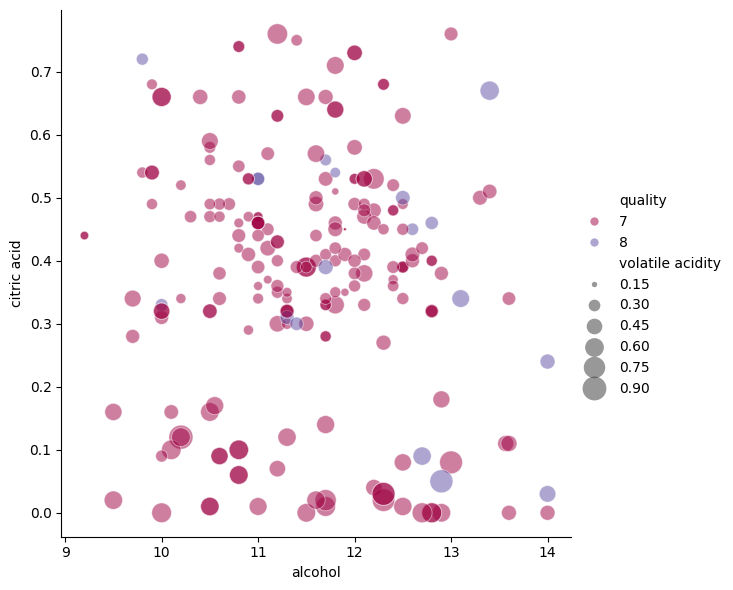

In [19]:
condicion=data_raw["quality"]>6

sns.relplot(data=data_raw[condicion],
            x="alcohol",
            y="citric acid",
            hue="quality", size="volatile acidity",
            sizes=(4, 300),
            alpha=.5, palette="Spectral",
            height=6)

Los datos siguen siendo dispersos, pero las tendencias ahora son más claras y no se observan outliers. Parece que se pueden identificar dos grupos:

* Los vinos con una concentración media de ácido cítrico y acidez media.
* Los vinos con una baja concentración de ácido cítrico y una acidez volátil más alta.

Sin una simplificación de variables, es difícil determinar con certeza hasta qué punto estas tendencias son reales. Ahora, vamos a estudiar las distribuciones de los datos.
(Agruparemos las variables de ácido cítrico y acidez volátil para ahorrar espacio).



<Axes: >

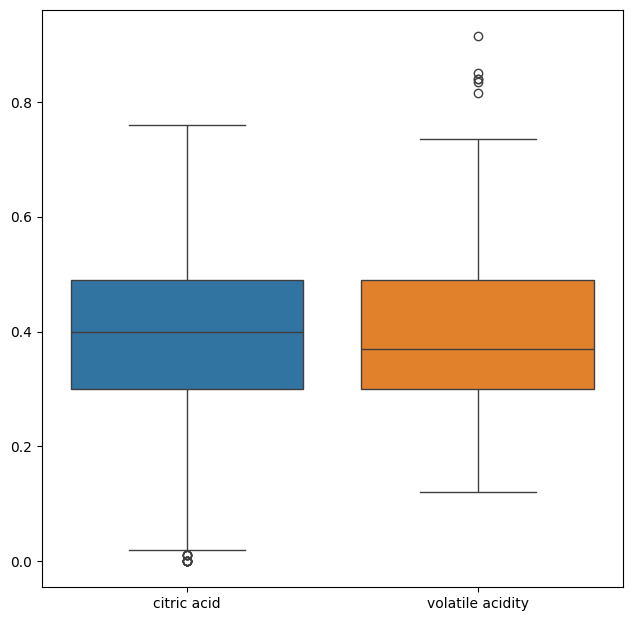

In [20]:
plt.figure(figsize=(7.5,7.5))
valores=["alcohol", "citric acid", "volatile acidity"]
data_classy=data_raw[condicion]
sns.boxplot(data=data_classy[["citric acid", "volatile acidity"]])


<Axes: ylabel='Count'>

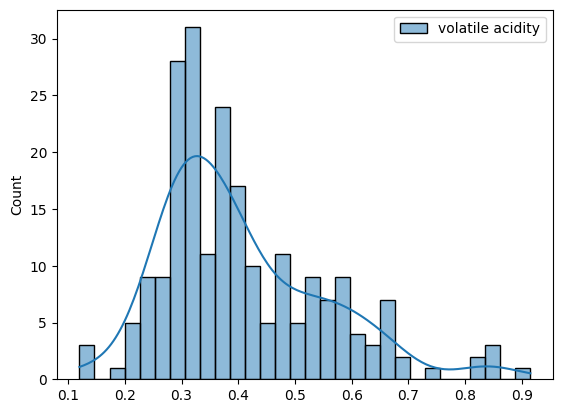

In [21]:
sns.histplot(data=data_classy[["volatile acidity"]], bins=30, kde=True)


In [22]:
stats.skew(data_classy[["volatile acidity"]])

array([0.99449445])

Segun el coeficiente de asimetria, no es tan asimetrico

<Axes: ylabel='Count'>

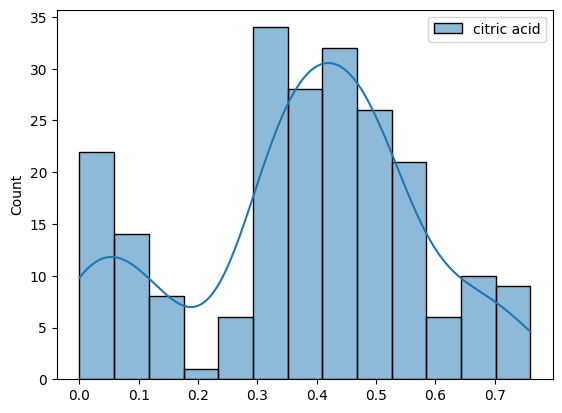

In [23]:
sns.histplot(data=data_classy[["citric acid"]], kde=True)


In [24]:
stats.skew(data_classy[["citric acid"]])

array([-0.37613563])

Recordemos que los percentiles del ácido cítrico no serán del todo representativos, ya que la variable no sigue una distribución normal.

Aun así, se observa que existen vinos con una concentración muy baja y otros con una concentración media, lo que sugiere la presencia de dos grupos bien diferenciados.


<Axes: >

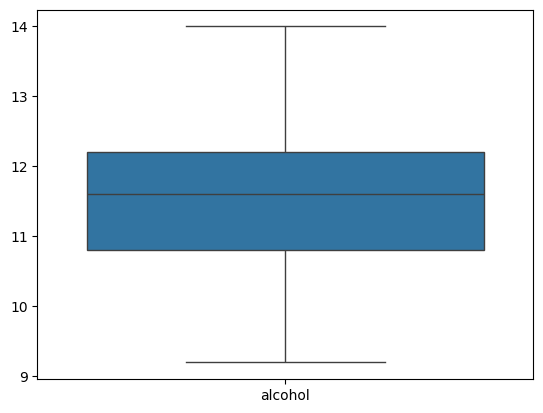

In [25]:
sns.boxplot(data=data_classy[["alcohol"]])

<Axes: ylabel='Count'>

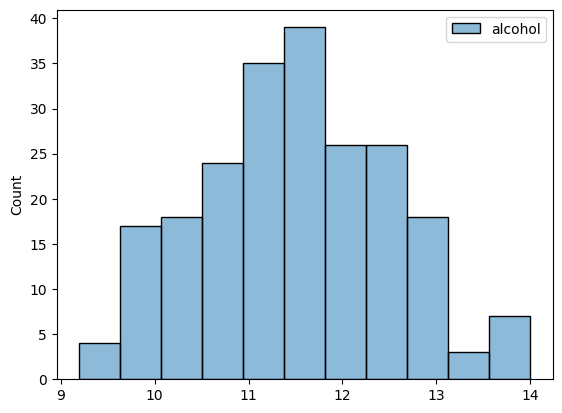

In [26]:
sns.histplot(data=data_classy[["alcohol"]])

In [27]:
data_per={}
cal_variable=data_classy[["volatile acidity","citric acid","alcohol", "sulphates"]]
for col in cal_variable:
    data_per[col]=((np.percentile(data_classy[col], 0)),(np.percentile(data_classy[col], 25)),((np.percentile(data_classy[col], 50))), ((np.percentile(data_classy[col], 75))), (np.percentile(data_classy[col], 100)))



data=pd.DataFrame(data_per, index=["p_0","p_25","p_50","p_75","p_100" ])
data


,volatile acidity,citric acid,alcohol,sulphates
p_0,0.120,0.00,9.2,0.39
p_25,0.300,0.30,10.8,0.65
p_50,0.370,0.40,11.6,0.74
p_75,0.490,0.49,12.2,0.82
p_100,0.915,0.76,14.0,1.36


Podríamos concluir que los vinos cuyas concentraciones de ácido cítrico, acidez volátil y volumen de alcohol se sitúan en torno al percentil 50  tienden a presentar una calidad aceptable.

Sin embargo, es importante señalar que este análisis solo ha considerado el efecto de tres variables (acidez volátil, ácido cítrico y volumen de alcohol) sobre la calidad del vino, sin estudiar las posibles relaciones o interacciones entre ellas. Realisticamente todas las variables y la relacion de estas afectarian a la calidad.

Además, el conjunto de datos (además de ser relativamente antiguo) es bastante limitado: solo contiene datos de una variante de vino, no incluye pocos vinos de calidad mayor de 8, tiene pocas muestras de vinos de calidad de 7 o mas  y tampoco contempla otros compuestos relevantes que influyen directamente en el sabor y aroma, como polifenoles, éteres o terpenos.

Otra variable que no se a estudiado que tiene influencia en sulfato.

__________
Otra duda que surge es: ¿Estas propiedades afectan de otra manera al vino blanco?

In [28]:
data_white=pd.read_csv("wine+quality/winequality-white.csv", sep=";")
data_white

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


<Axes: >

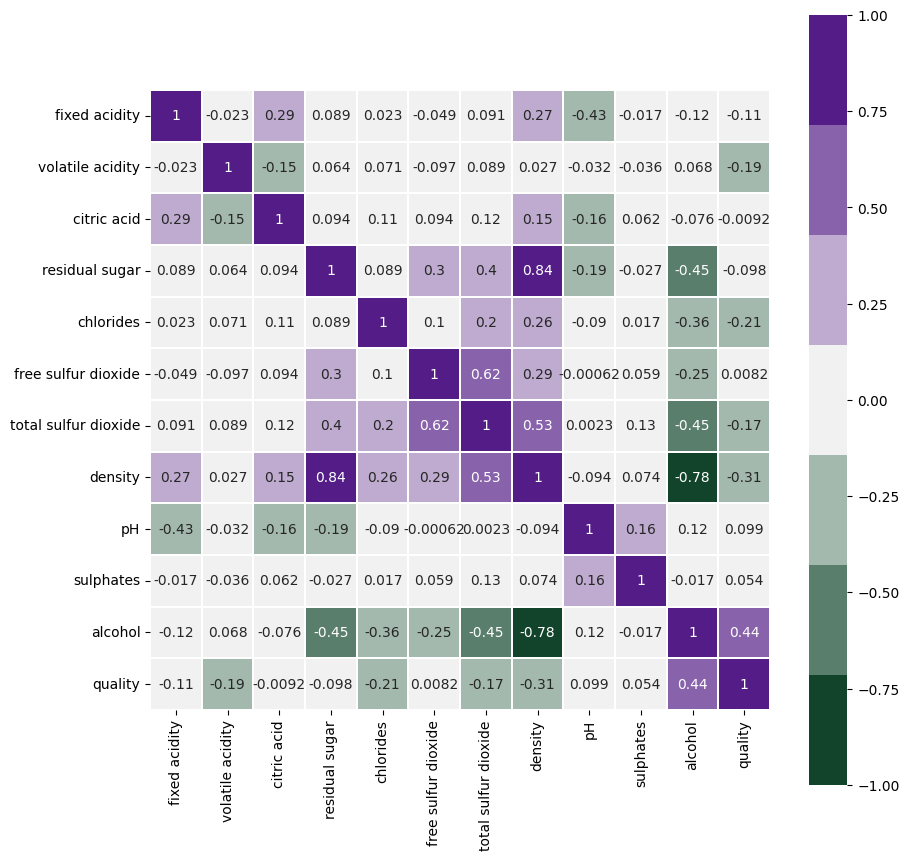

In [29]:
plt.figure(figsize=(10,10))
sns.heatmap(data_white.corr(),
            vmin=-1,
            vmax=1,
            cmap=sns.diverging_palette(145, 280, s=85, l=25, n=7),
            square=True,
            linewidths=.1,
            annot=True)

Consideraremos 0.15 como el punto cut-off
Curiosamente algunas correlaciones correlaciones del vino blanco son distintas al tinto.

* La acidez fija esta relacionada:
    * Acido citrico (0.29)
    * Densidad (0.27)
    * Negativamente pH (-0.43)
* La acidez volatil esta relacionada:
    * Acido citrico (-0.15)
    * Calidad (-0.19)
* Acido citrico:
    * Acidez fija(0.29)
    * Acidez volatil(-0.15)
    * Densidad (0.15)
    * pH (-0.16)
* El azúcar residual:
    * SO2 libre (0.3)    
    * SO2 total (0.4)
    * Densidad (0.84)
    * pH (-0.19)
    * Alcohol (-0.45)
* Cloruro:
    * SO2 total (0.3)
    * Densidad (0.26)
    * Alcohol (-0.36)
    * Calidad (-0.21)
* El SO2 libre
    * Azucar residual (0.3)
    * SO2 (0.62)
    * Densidad (0.29)
    * Alcohol (-0.25)
* SO2 total
    * Azucar residual (0.4)
    * Cloruros (0.2)
    * SO2 libre (0.62)
    * Densidad (0.53)
    * Alcohol (-0.78)
    * Calidad (-0.31)
* Densidad
    * Acidez fija (0.27)
    * Acido citrico (0.15)
    * Azucar residual (0.84)
    * Cloruros (0.26)
    * SO2 libre (0.29)
    * SO2 total (0.53)
    * Alcohol (-0.45)
    * Calidad (-0.45)
* pH
    * Acidez fija (-0.43)
    * Acido citrico (-0.16)
    * Azucar residual (-0.19)
    * Sulfatos (0.16)
* Sulfato
    * pH (0.16)
* El alcohol:
    * Azucar residual (-0.45)
    * Cloruros (-0.26)
    * SO2 libre (-0.25)
    * SO2 total (-0.45)
    * Densidad (-0.78)
    * Calidad (0.44)

* Y finalmente la calidad esta relacionada:
    * Acidez volatil (-0.19)
    * Cloruros (-0.21)
    * SO2 total (-0.17)
    * Densidad (-0.31)
    * Alcohol (0.44)


Curiosamente, los parámetros no coinciden con los del vino tinto. En ambos casos, parece valorarse positivamente un mayor contenido de alcohol y negativamente una alta acidez volátil, una densidad elevada y un alto contenido de SO₂ total.

Sin embargo, en el vino blanco, el ácido cítrico y los sulfatos parecen tener un efecto menos significativo, mientras que los cloruros influyen en mayor medida.


<Figure size 1000x600 with 0 Axes>

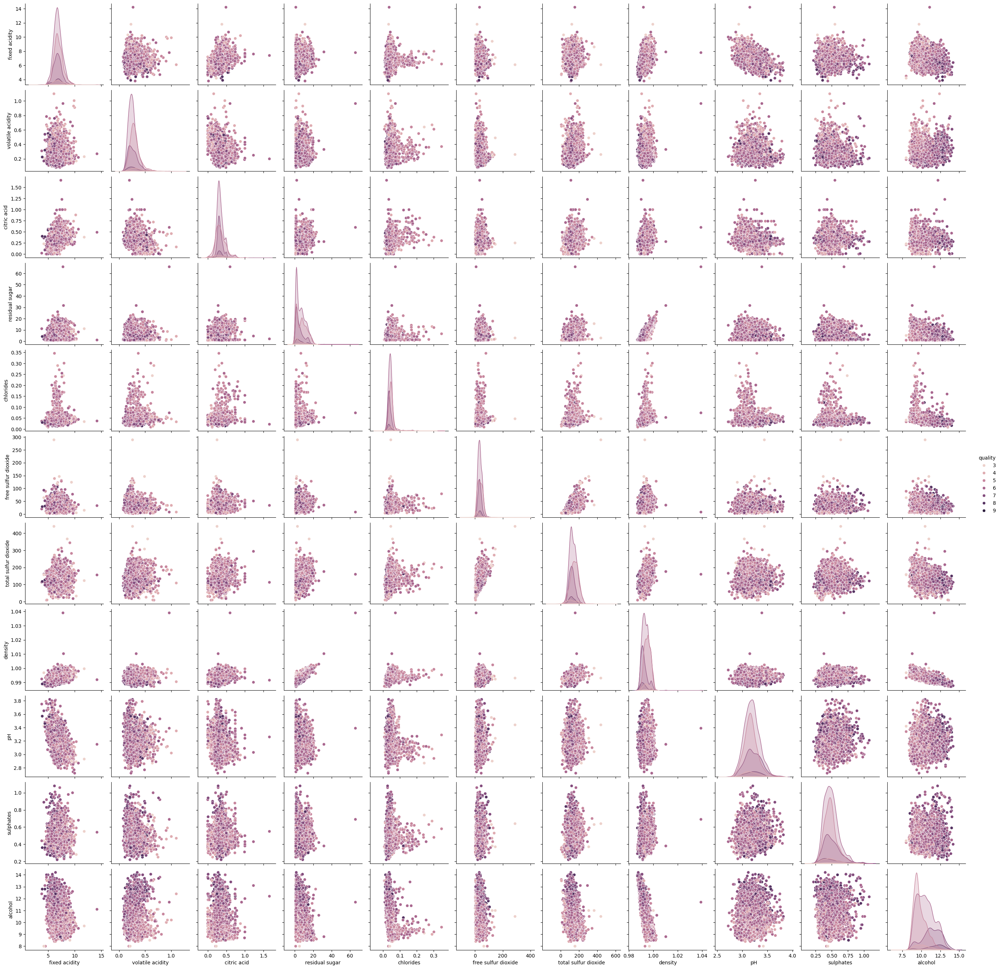

In [30]:
plt.figure(figsize=(10,6))
sns.pairplot(data_white, hue="quality")

En este dataset se ven mucho mejor los outliers. Seria mejor eliminarlos.

In [31]:
data_white["residual sugar"].max()

np.float64(65.8)

In [32]:
condicion=data_white["residual sugar"]==65.8
data_white[condicion]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
2781,7.8,0.965,0.6,65.8,0.074,8.0,160.0,1.03898,3.39,0.69,11.7,6


Seguramente sea un error

In [33]:
data_white.drop(index=2781,axis=1 , inplace=True)

Volvamos a verlo

In [34]:
data_white["fixed acidity"].max()

np.float64(14.2)

In [35]:
condicion=data_white["fixed acidity"]==14.2
data_white[condicion]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1526,14.2,0.27,0.49,1.1,0.037,33.0,156.0,0.992,3.15,0.54,11.1,6


In [36]:
data_white.drop(index=1526,axis=1 , inplace=True)

In [37]:
data_white["free sulfur dioxide"].max()

np.float64(289.0)

In [38]:
condicion=data_white["free sulfur dioxide"]==289.0
data_white[condicion]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
4745,6.1,0.26,0.25,2.9,0.047,289.0,440.0,0.99314,3.44,0.64,10.5,3


In [39]:
data_white.drop(index=4745,axis=1 , inplace=True)

In [40]:
data_white["density"].max()

np.float64(1.0103)

In [41]:
condicion=data_white["density"]==1.0103
data_white[condicion]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1653,7.9,0.33,0.28,31.6,0.053,35.0,176.0,1.0103,3.15,0.38,8.8,6
1663,7.9,0.33,0.28,31.6,0.053,35.0,176.0,1.0103,3.15,0.38,8.8,6


In [42]:
data_white.drop(index=1653,axis=1 , inplace=True)
data_white.drop(index=1663,axis=1 , inplace=True)

In [43]:
data_white["citric acid"].max()


np.float64(1.66)

In [44]:
condicion=data_white["citric acid"]==1.66
data_white[condicion]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
745,7.4,0.2,1.66,2.1,0.022,34.0,113.0,0.99165,3.26,0.55,12.2,6


In [45]:
data_white.drop(index=745,axis=1 , inplace=True)

---
Tras esto las correlaciones no han cambiado en exceso

<Axes: >

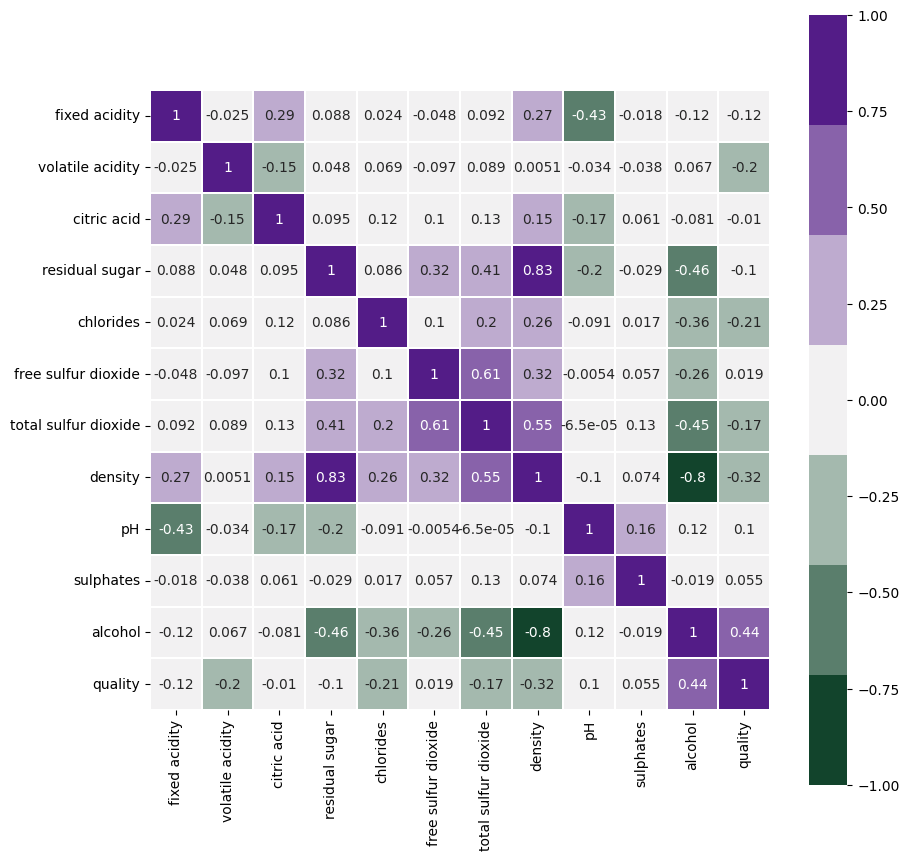

In [46]:
plt.figure(figsize=(10,10))
sns.heatmap(data_white.corr(),
            vmin=-1,
            vmax=1,
            cmap=sns.diverging_palette(145, 280, s=85, l=25, n=7),
            square=True,
            linewidths=.1,
            annot=True)

<Axes: xlabel='residual sugar', ylabel='Count'>

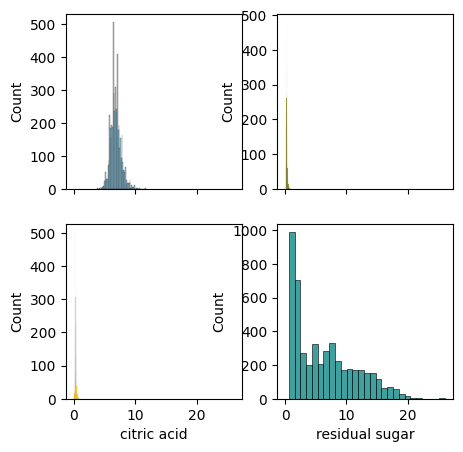

In [59]:
f, axes = plt.subplots(2, 2, figsize=(5,5), sharex=True)
sns.histplot(data_white["fixed acidity"] , color="skyblue", ax=axes[0, 0])
sns.histplot(data_white["volatile acidity"] , color="olive", ax=axes[0, 1])
sns.histplot(data_white["citric acid"] , color="gold", ax=axes[1, 0])
sns.histplot(data_white["residual sugar"] , color="teal", ax=axes[1, 1])



<Axes: xlabel='density', ylabel='Count'>

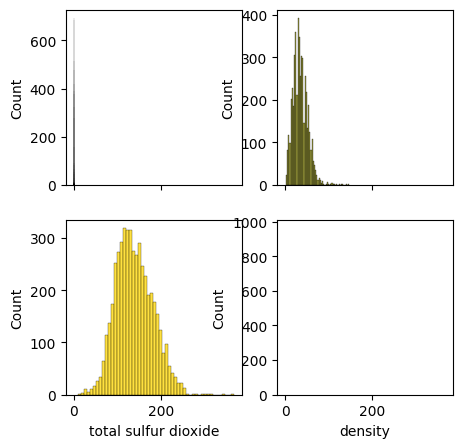

In [60]:
f, axes = plt.subplots(2, 2, figsize=(5,5), sharex=True)
sns.histplot(data_white["chlorides"] , color="skyblue", ax=axes[0, 0], bins=100)
sns.histplot(data_white["free sulfur dioxide"] , color="olive", ax=axes[0, 1])
sns.histplot(data_white["total sulfur dioxide"] , color="gold", ax=axes[1, 0])
sns.histplot(data_white["density"] , color="teal", ax=axes[1, 1], bins= 10)

<Axes: xlabel='quality', ylabel='Count'>

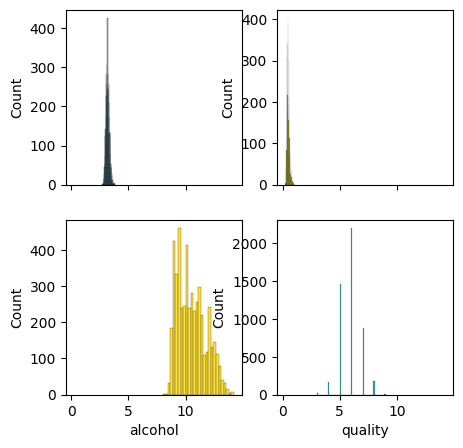

In [61]:
f, axes = plt.subplots(2, 2, figsize=(5,5), sharex=True)
sns.histplot(data_white["pH"] , color="skyblue", ax=axes[0, 0])
sns.histplot(data_white["sulphates"] , color="olive", ax=axes[0, 1])
sns.histplot(data_white["alcohol"] , color="gold", ax=axes[1, 0])
sns.histplot(data_white["quality"] , color="teal", ax=axes[1, 1])

Parece que siguen una distribucion normal, aunque son imagenes muy pequeña.

<Figure size 1000x600 with 0 Axes>

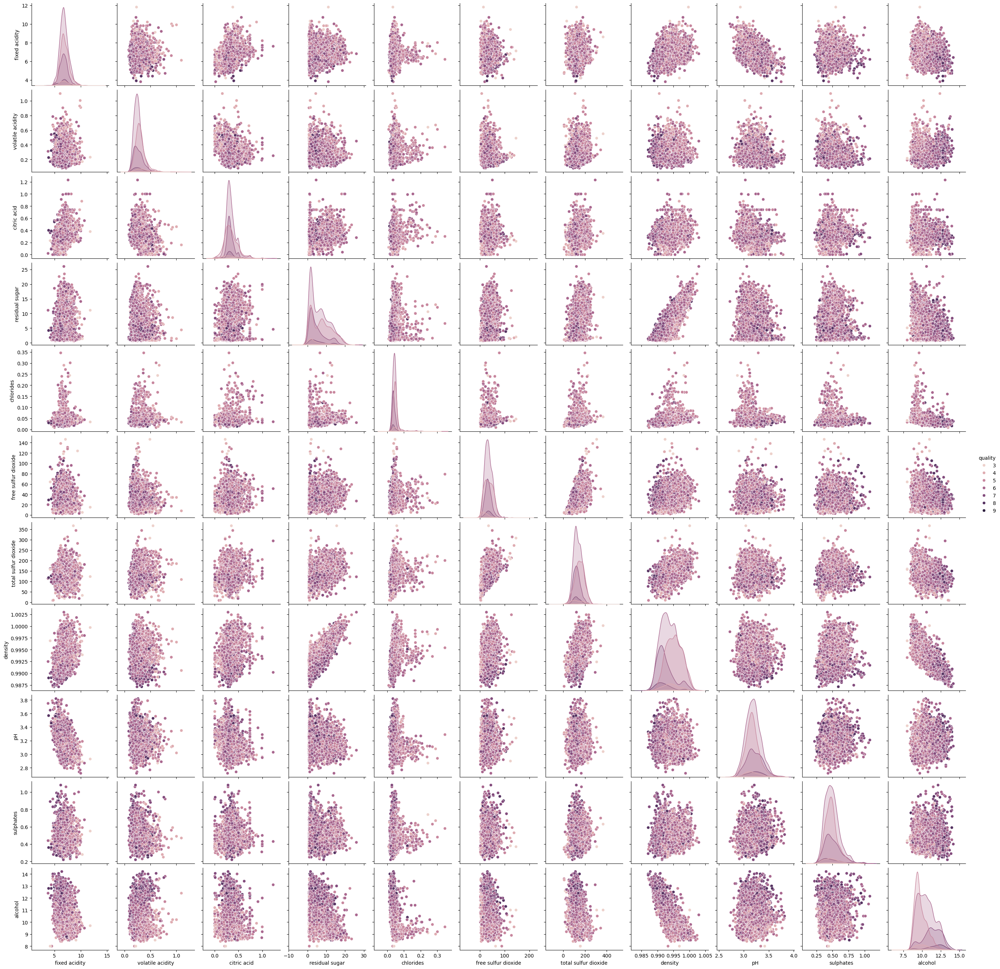

In [47]:
plt.figure(figsize=(10,6))
sns.pairplot(data_white, hue="quality")

En este conjunto de datos se observan de forma muy clara algunas correlaciones, como la del pH con la acidez fija o la de la densidad con el azúcar residual 
Las distribuciones de azúcar residual, ácido cítrico, SO₂ libre, alcohol, densidad y sulfatos resultan especialmente interesantes, por lo que vamos a analizarlas con mayor detalle.

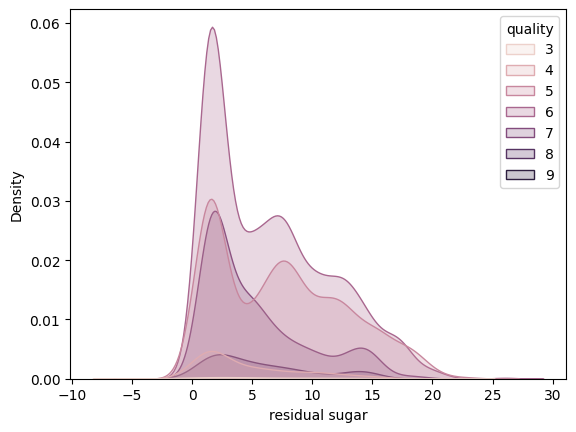

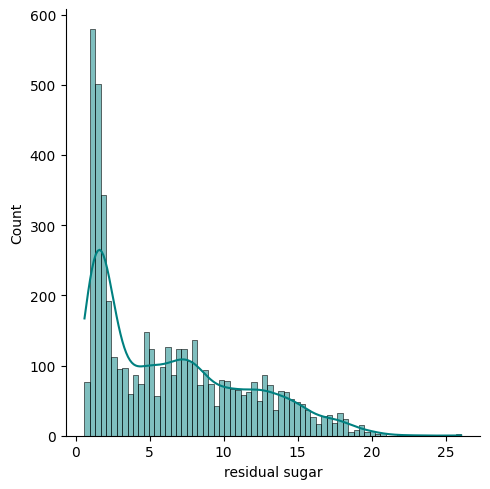

In [48]:
sns.kdeplot(x="residual sugar", data=data_white, hue="quality",  fill=True)
sns.displot(data_white["residual sugar"], kde= True, color="teal", bins=70)

Los vinos de mejor calidad tienden a tener menos azucar residual. Tiene sentido, ya que un alto contenido en alchol esta relacionando con mayor calidad y menor azucar residual. Tambien parece que tiene tener tres grupos diferenciados en todas las calidades.

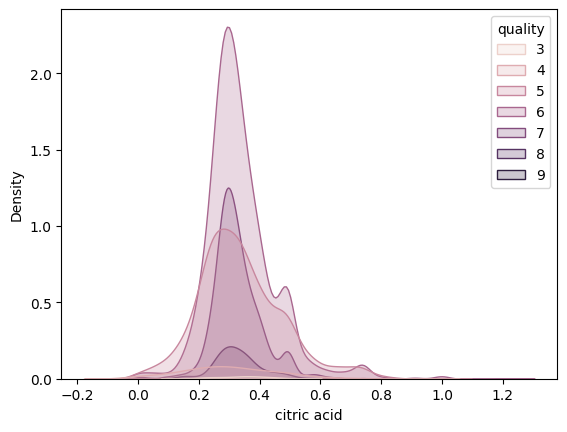

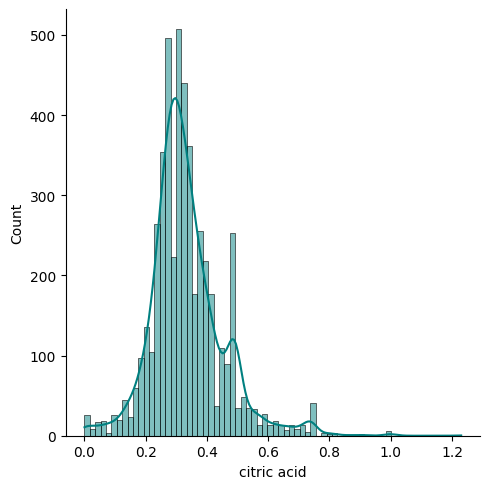

In [49]:
sns.kdeplot(x="citric acid", data=data_white, hue="quality",  fill=True)
sns.displot(data_white["citric acid"], kde= True, color="teal", bins=70)

Todos los niveles tienen varios niveles de concentracion en todos los niveles, aunque puede deberse a falta de datos.

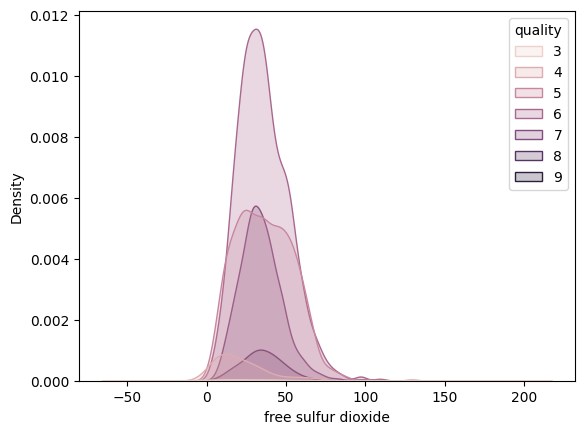

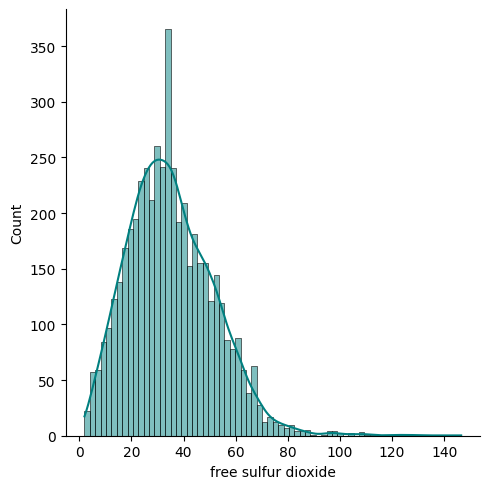

In [50]:
sns.kdeplot(x="free sulfur dioxide", data=data_white, hue="quality",  fill=True)
sns.displot(data_white["free sulfur dioxide"], kde= True, color="teal", bins=70)

Parece que sigue una distribucion, los de mayor calidad sinplemente tienen menos dispersion.

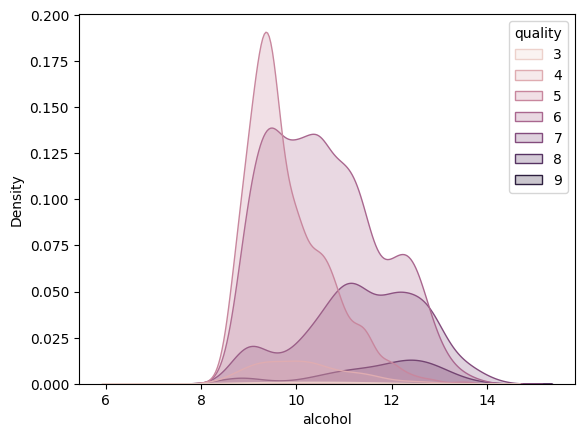

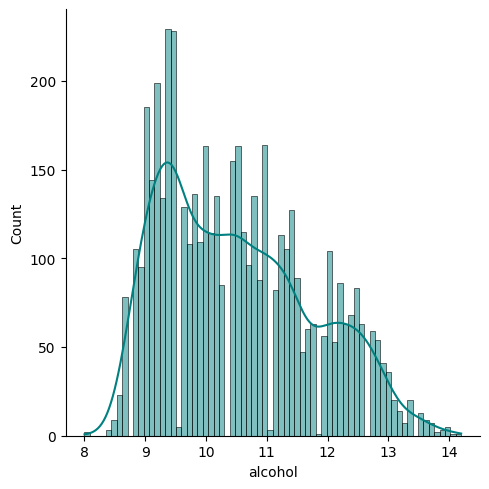

In [51]:
sns.kdeplot(x="alcohol", data=data_white, hue="quality",  fill=True)
sns.displot(data_white["alcohol"], kde= True, color="teal", bins=70)

De forma similar al dataset del tinto los vinos de calidad mayor tienen un mayor contenido alchol

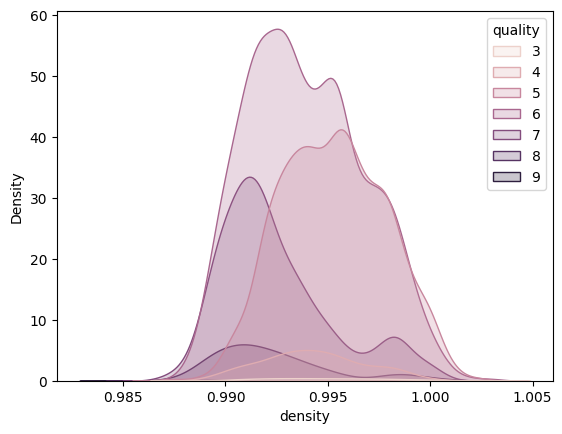

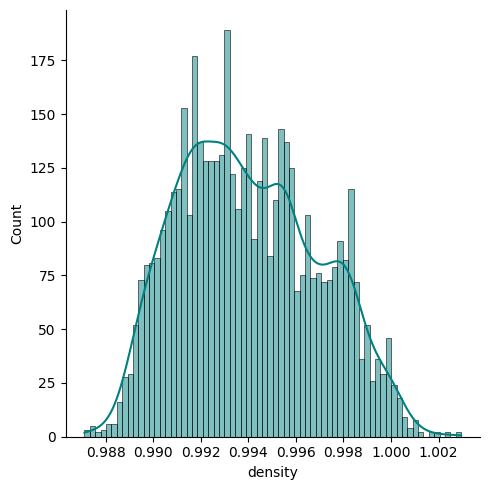

In [52]:
sns.kdeplot(x="density", data=data_white, hue="quality",  fill=True)
sns.displot(data_white["density"], kde= True, color="teal", bins=70)

La baja densidad esta relacionada calidad. Pero seguramente sea por el contenido en alcohol.

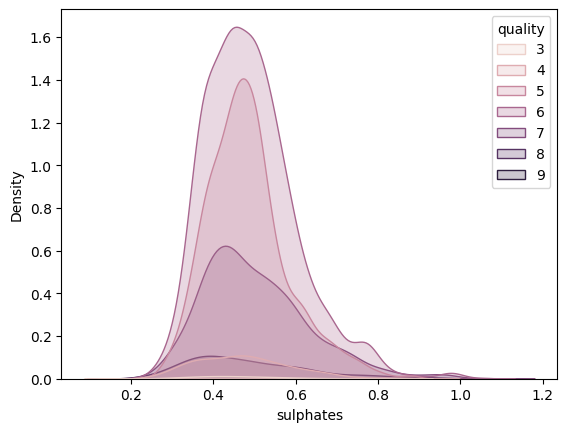

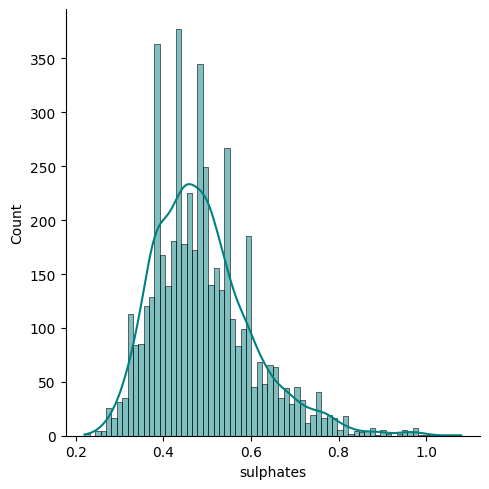

In [53]:
sns.kdeplot(x="sulphates", data=data_white, hue="quality",  fill=True)
sns.displot(data_white["sulphates"], kde= True, color="teal", bins=70)

Los sulfatos tienes una distribucion bastante normal.

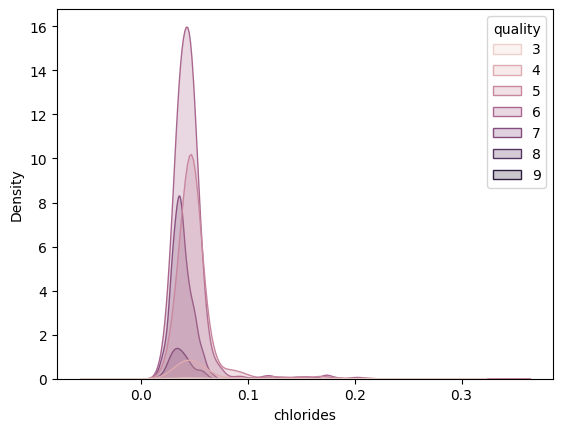

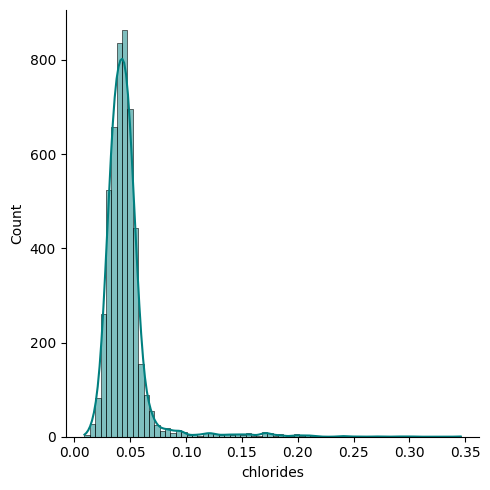

In [54]:
sns.kdeplot(x="chlorides", data=data_white, hue="quality",  fill=True)
sns.displot(data_white["chlorides"], kde= True, color="teal", bins=70)

<Figure size 200x200 with 0 Axes>

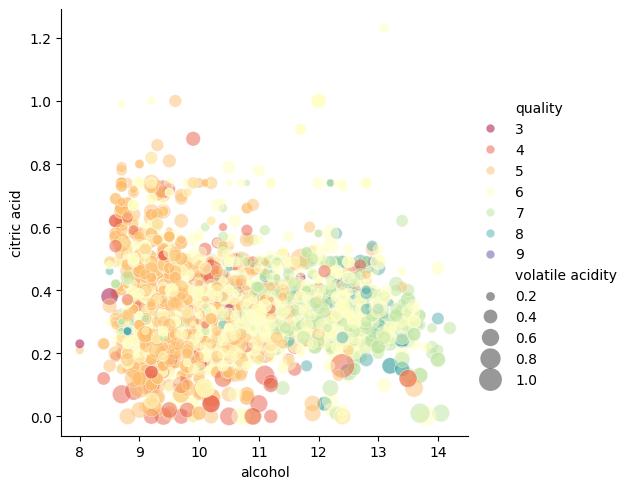

In [55]:

plt.figure(figsize=(2,2))
sns.relplot(data=data_white,
            x="alcohol",
            y="citric acid",
            hue="quality", size="volatile acidity",
            sizes=(6, 300),
            alpha=.5, palette="Spectral",
            height=5)

Hay demasiados datos muy dispersos. Vamos a filtrarlos a partir del 7.

<Figure size 200x200 with 0 Axes>

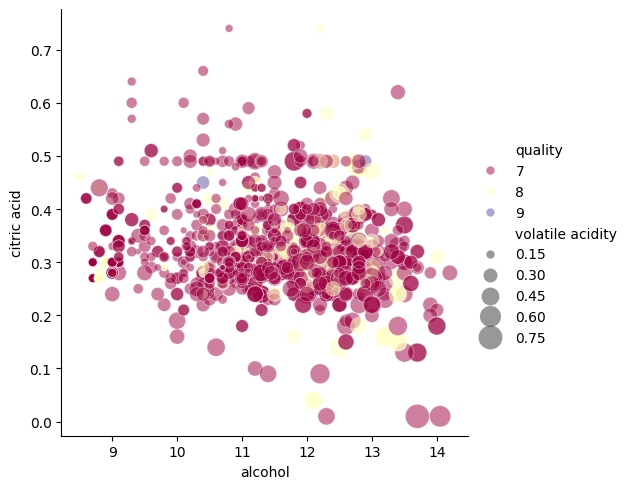

In [56]:
condicion=data_white["quality"]>=7
plt.figure(figsize=(2,2))
sns.relplot(data=data_white[condicion],
            x="alcohol",
            y="citric acid",
            hue="quality", size="volatile acidity",
            sizes=(6, 300),
            alpha=.5, palette="Spectral",
            height=5)

Parece que la mayoria esta en la zona central. Podemos estimar una zona donde la calidad sea alta.

In [57]:
data_per={}
condicion=data_white["quality"]>=7
white_classy=data_white[condicion]
cal_variable=white_classy[["volatile acidity","citric acid","alcohol", "sulphates", "chlorides"]]
for col in cal_variable:
    data_per[col]=((np.percentile(white_classy[col], 0)),(np.percentile(white_classy[col], 25)),((np.percentile(white_classy[col], 50))), ((np.percentile(white_classy[col], 75))), (np.percentile(white_classy[col], 100)))



datawhite=pd.DataFrame(data_per, index=["p_0","p_25","p_50","p_75","p_100" ])
datawhite

,volatile acidity,citric acid,alcohol,sulphates,chlorides
p_0,0.08,0.01,8.5,0.22,0.012
p_25,0.19,0.28,10.7,0.40,0.031
p_50,0.25,0.31,11.5,0.48,0.037
p_75,0.32,0.36,12.4,0.58,0.044
p_100,0.76,0.74,14.2,1.08,0.135


El acido citrico y el alcohol tienen concentraciones muy similares, mientras tanto los sulfatos, y la acidez volatil son mas pequeñas.

La mayoria de estos tienen una distribucion parecida a la normal, por lo que deberias de aproximar los percentiles mejor que el otro dataset. 

Sin embargo, los histogramas este dataset tiene mas muestras que estarian fuera de los limites.

De forma similar al otro dataset, podemos ver que existen pocas muestras de calidad alta. Este analisis sigue siendo univariante, sin tener en cuenta la relacion de las variables, algo que se deberia cambiar a futuro. Sin embargo, este dataset tiene muchas mas muestras

In [58]:
data

,volatile acidity,citric acid,alcohol,sulphates
p_0,0.120,0.00,9.2,0.39
p_25,0.300,0.30,10.8,0.65
p_50,0.370,0.40,11.6,0.74
p_75,0.490,0.49,12.2,0.82
p_100,0.915,0.76,14.0,1.36
